In [ ]:
# thư viện
import json
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2

Thư mục ảnh kết quả: https://drive.google.com/drive/folders/1uvrVq-B4pTbtjU9yjxNcD3JAUE49yN8I?usp=sharing

# Multimatch

In [ ]:
# đường dẫn đến file
path_Scanpath = "/content/drive/MyDrive/Colab_Notebooks/DO_AN_KHDL/scanpath_ratio.json"
# load file
with open(path_Scanpath, 'r') as file:
    report = json.load(file)

In [ ]:
# load vào data frame
keys = [list(item.keys())[0] for item in report]
score_scanpath = [list(item.values())[0] for item in report]

df = pd.DataFrame({'key': keys, 'scanpath': score_scanpath})
# tách lấy task
df['task'] = [s.split('_')[0] for s in df['key']]
df.head()

,key,scanpath,task
0,bottle_000000037367.jpg,0.828572,bottle
1,bottle_000000122602.jpg,0.858676,bottle
2,bottle_000000137967.jpg,0.983832,bottle
3,bottle_000000138086.jpg,0.953125,bottle
4,bottle_000000148977.jpg,0.904728,bottle


In [ ]:
df.describe()


,scanpath
count,5099.000000
mean,0.867816
std,0.231183
min,0.081228
25%,0.874432
50%,0.980462
75%,1.000000
max,1.000000


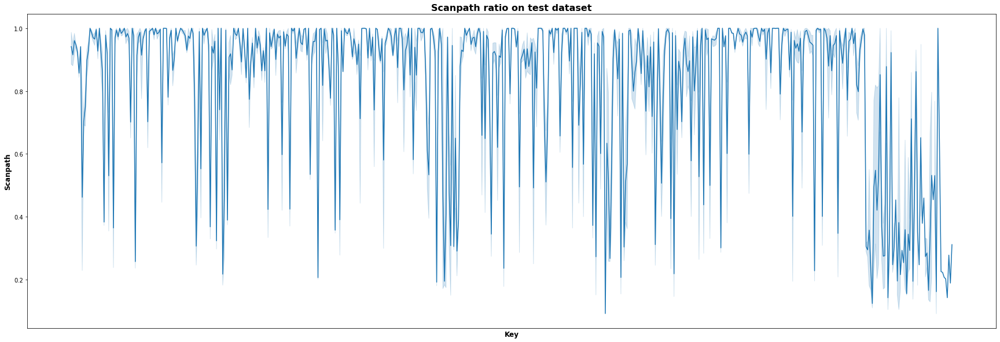

In [ ]:
import seaborn as sns
plt.figure(figsize=(30,10))
sns.lineplot(data=df, x="key", y="scanpath")
plt.title("Scanpath ratio on test dataset", fontsize=16, fontweight='bold')
plt.xlabel("Key", fontsize=12, fontweight='bold')
plt.ylabel("Scanpath", fontsize=12, fontweight='bold')
plt.xticks([], rotation=90)
plt.show()

#Global worst/ best scanpath ratio

In [ ]:
best_global = df.loc[df.scanpath.idxmax()].key
best_global

'bottle_000000294475.jpg'

In [ ]:
worst_global = df.loc[df.scanpath.idxmin()].key
worst_global

'keyboard_000000178469.jpg'

In [ ]:
# quan sát worst
worst_shape = df.loc[df['scanpath'] <= df.describe()['scanpath']["25%"]]
print("25% ({} điểm dữ liệu) dự đoán test của mô hình là dưới {}."\
      .format(len(worst_shape), round(df.describe()['scanpath']["25%"], 3)))
print("{} điểm dữ liệu < 0.7".format(len(df.loc[df['scanpath'] <= 0.7])))
print("{} điểm dữ liệu < 0.8, chiếm {:.2f}"\
      .format(len(df.loc[df['scanpath'] <= 0.8]), len(df.loc[df['scanpath'] <= 0.8]) / len(df)))
global_shape_smaller_than_70percent = df.loc[df['scanpath'] <= 0.7]['key']
print("Các điểm dữ liệu có scanpath < 0.8 là:\n", '\t '.join(global_shape_smaller_than_70percent))
global_shape_smaller_than_80percent = df.loc[df['scanpath'] <= 0.8]['key']
print("Các điểm dữ liệu có scanpath < 0.8 là:\n", '\t '.join(global_shape_smaller_than_80percent))

25% (1276 điểm dữ liệu) dự đoán test của mô hình là dưới 0.874.
790 điểm dữ liệu < 0.7
965 điểm dữ liệu < 0.8, chiếm 0.19
Các điểm dữ liệu có scanpath < 0.8 là:
 bottle_000000225129.jpg	 bottle_000000231822.jpg	 bottle_000000478155.jpg	 bowl_000000019589.jpg	 bowl_000000377359.jpg	 car_000000499775.jpg	 chair_000000291981.jpg	 chair_000000298773.jpg	 chair_000000340934.jpg	 chair_000000398209.jpg	 chair_000000452947.jpg	 chair_000000556420.jpg	 chair_000000562507.jpg	 chair_000000570465.jpg	 cup_000000260105.jpg	 cup_000000366852.jpg	 cup_000000432258.jpg	 cup_000000530259.jpg	 cup_000000572260.jpg	 fork_000000364911.jpg	 keyboard_000000264385.jpg	 keyboard_000000459440.jpg	 keyboard_000000487002.jpg	 keyboard_000000565034.jpg	 knife_000000211326.jpg	 knife_000000219546.jpg	 knife_000000269450.jpg	 knife_000000355106.jpg	 knife_000000377611.jpg	 knife_000000425526.jpg	 knife_000000442877.jpg	 laptop_000000493753.jpg	 laptop_000000547144.jpg	 microwave_000000059383.jpg	 microwave_000000

In [ ]:
def display_image_in_actual_size(im_path):

    dpi = 60
    im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

In [ ]:
path = []
result_path = "/content/drive/MyDrive/Colab_Notebooks/DO_AN_KHDL/results/"
for img in global_shape_smaller_than_70percent:
  path.append(result_path+img.replace('_', '/'))

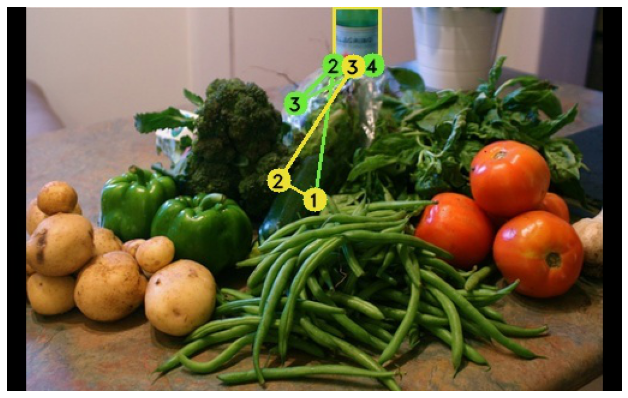

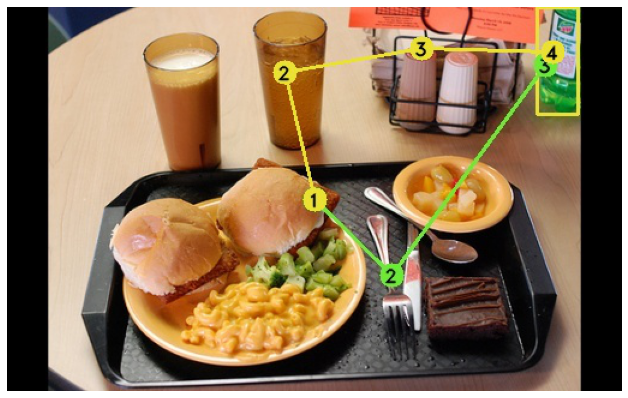

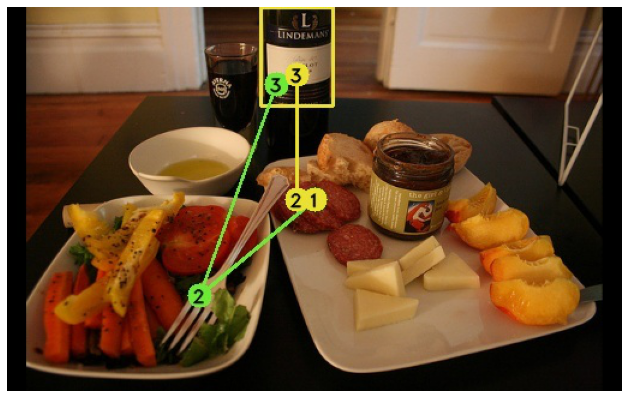

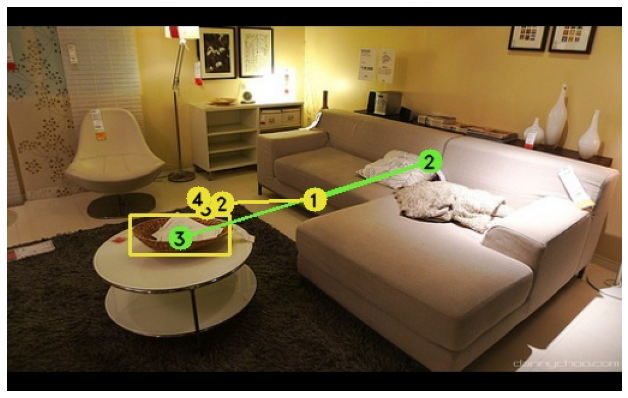

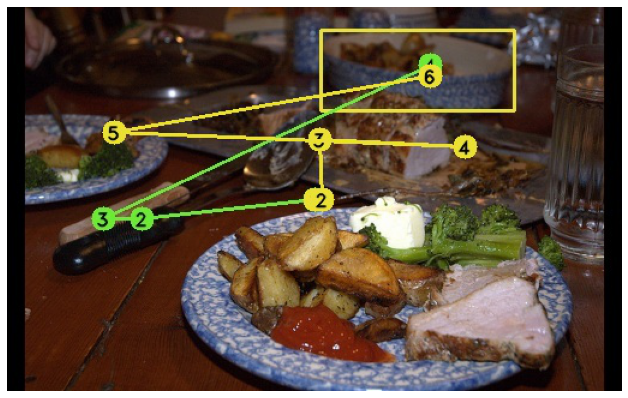

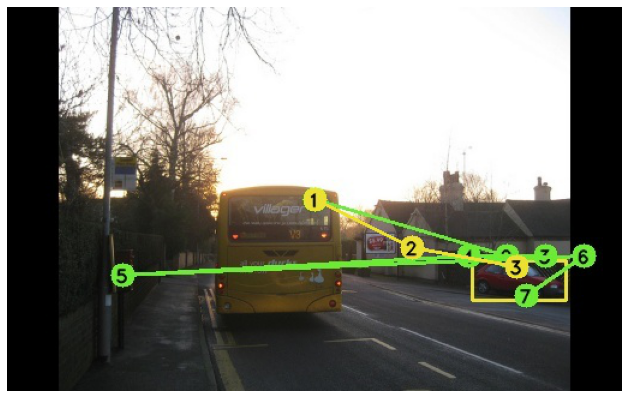

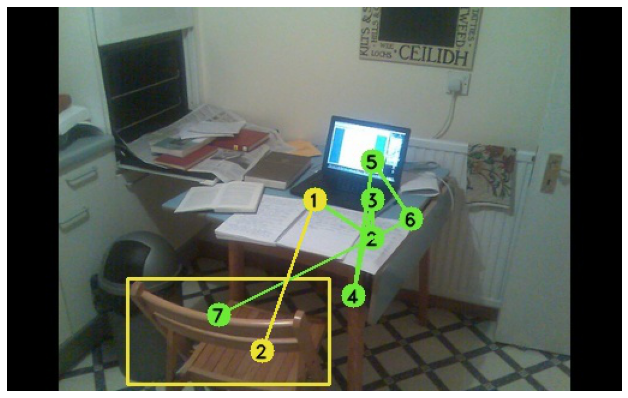

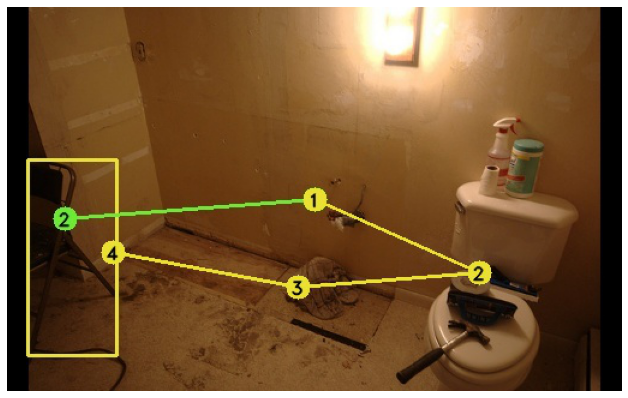

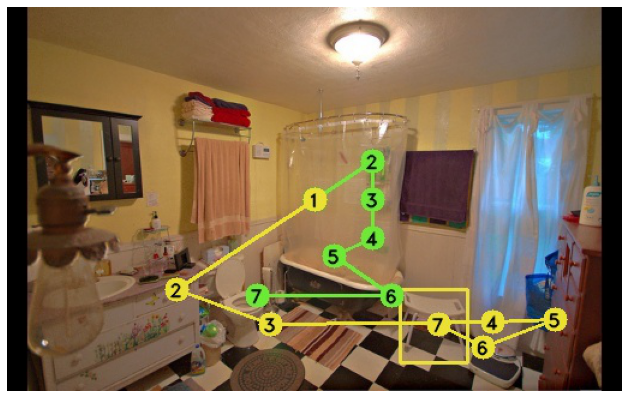

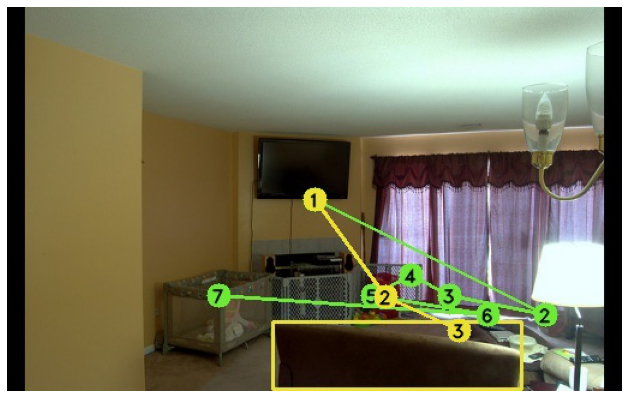

In [ ]:
for i in range(10):
  display_image_in_actual_size(path[i])

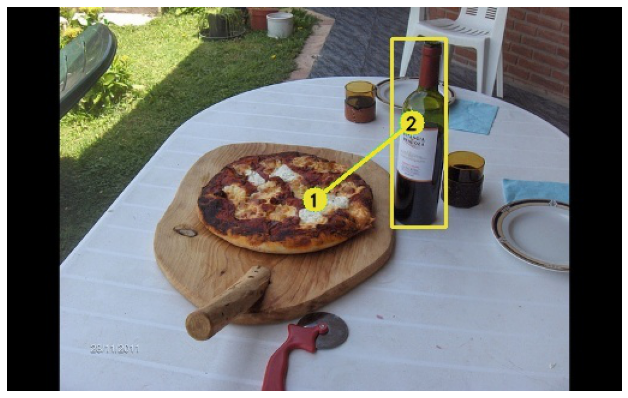

In [ ]:
display_image_in_actual_size(result_path+best_global.replace('_', '/'))

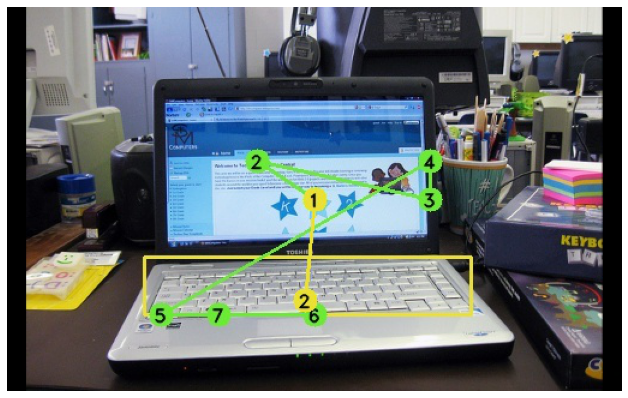

In [ ]:
display_image_in_actual_size(result_path+worst_global.replace('_', '/'))

# Local worst/ best scanpath ratio

In [ ]:
categories = list(df['task'].unique())
print(len(categories))
print(categories)

18
['bottle', 'bowl', 'car', 'chair', 'clock', 'cup', 'fork', 'keyboard', 'knife', 'laptop', 'microwave', 'mouse', 'oven', 'potted plant', 'sink', 'stop sign', 'toilet', 'tv']


In [ ]:
scanpath_min, scanpath_max = [], []
for cat in categories:
  local_df = df.loc[df['task'] == cat]
  # print("Nhóm :", cat)
  scanpath_min.append(round(local_df.describe()['scanpath']['min'], 3))
  scanpath_max.append(round(local_df.describe()['scanpath']['max'], 3))

multi_match_local_df = pd.DataFrame({'Key': categories, 'scanpath_min': scanpath_min, 'scanpath_max': scanpath_max})
multi_match_local_df

,Key,scanpath_min,scanpath_max
0,bottle,0.193,1.0
1,bowl,0.105,1.0
2,car,0.169,1.0
3,chair,0.093,1.0
4,clock,0.116,1.0
5,cup,0.193,1.0
6,fork,0.141,1.0
7,keyboard,0.081,1.0
8,knife,0.107,1.0
9,laptop,0.120,1.0


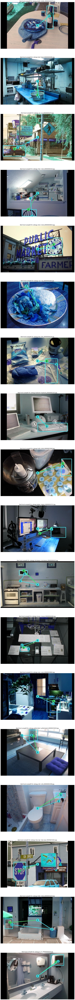

In [ ]:
fig = plt.figure(figsize=(50, 200))
aspects = ['scanpath']
result_path = "/content/drive/MyDrive/Colab_Notebooks/DO_AN_KHDL/results/"
subplot_count = 1
for cat in categories:
  local_df = df.loc[df['task'] == cat]
  for a in aspects:
    filename = list(local_df.loc[local_df[a] == local_df.describe()[a]['max']]['key'])[0]
    best_local = result_path + filename.replace('_', '/')
    fig.add_subplot(18, 1, subplot_count)
    plt.imshow(cv2.imread(best_local))
    plt.axis('off')
    plt.title('Best local {} for cateogy {}: {}.'.format(a, cat, filename))
    subplot_count = subplot_count + 1